# ANÁLISE EXPLORATÓRIA DE DADOS (AED)

* Parte fundamental do processo de Machine Learning;

* Permite conhecer e se familiarizar com os dados 

* Permite a geração de insights;

* Ajuda na compreensão do problema;

* Permite caminhar com as próprias "pernas".

## 1. EXPLORAÇÃO DE CONCEITOS

In [32]:
import numpy as np
import pandas as pd
import warnings
import math
warnings.filterwarnings("ignore", category=FutureWarning)
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import pandas_profiling


In [36]:
dados = pd.read_csv('state.csv', sep=",")


### 1.1 Algumas funcionalidades


In [39]:
dados.head(8)

,State,Population,Murder.Rate,Abbreviation
0,Alabama,4779736,5.7,AL
1,Alaska,710231,5.6,AK
2,Arizona,6392017,4.7,AZ
3,Arkansas,2915918,5.6,AR
4,California,37253956,4.4,CA
5,Colorado,5029196,2.8,CO
6,Connecticut,3574097,2.4,CT
7,Delaware,897934,5.8,DE


In [40]:
dados.tail()

,State,Population,Murder.Rate,Abbreviation
45,Virginia,8001024,4.1,VA
46,Washington,6724540,2.5,WA
47,West Virginia,1852994,4.0,WV
48,Wisconsin,5686986,2.9,WI
49,Wyoming,563626,2.7,WY


In [41]:
dados.shape

(50, 4)

In [42]:
dados.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50 entries, 0 to 49
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   State         50 non-null     object 
 1   Population    50 non-null     int64  
 2   Murder.Rate   50 non-null     float64
 3   Abbreviation  50 non-null     object 
dtypes: float64(1), int64(1), object(2)
memory usage: 1.7+ KB


Tipos de dados: Contínuos, Discretos, Categóricos, Binários, Ordinais

### 1.2  Medidas de tendência central

 Média

In [43]:
dados['Population'].mean()

6162876.3

 Mediana

In [46]:
dados['Population'].median()

4436369.5

In [50]:
x = [1,2,3,4,5]
y = [5,5,5,5,5]
z = [0,0,0,0,25]
sum(x)/len(x)

3.0

### 1.3 Medidas de Dispersão

Variância

In [8]:
dados['Population'].var()

46898327373394.445

Desvio Padrão

In [9]:
dados['Population'].std()

6848235.347401142

### 1.4 Explorando a distribuição de Dados

#### Percentis

In [56]:
dados['Murder.Rate'].median()

4.0

In [57]:
np.percentile(dados['Murder.Rate'], 99)

9.466999999999997

In [58]:
def percentil(dados, variavel):
    p = []
    for i in range(1,101):
        p.append(np.percentile(dados[variavel], i))
    df = pd.DataFrame(columns=['Percentil', variavel])
    df[variavel] = p
    df[variavel] = df[variavel].round(2)
    for i in range(len(df.Percentil)):
        df['Percentil'][i] = i+1
    df.set_index('Percentil', inplace=True)
    df = df.drop_duplicates(keep='last')
    return df

In [60]:
perc = percentil(dados, 'Murder.Rate')
perc

<ipython-input-58-a22624bf9172>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Murder.Rate
Percentil,
1,1.24
2,1.59
6,1.60
7,1.69
8,1.78
...,...
96,6.68
97,7.66
98,8.63


Facilitando...

In [61]:
dados.describe()

,Population,Murder.Rate
count,5.000000e+01,50.000000
mean,6.162876e+06,4.066000
std,6.848235e+06,1.915736
min,5.636260e+05,0.900000
25%,1.833004e+06,2.425000
50%,4.436370e+06,4.000000
75%,6.680312e+06,5.550000
max,3.725396e+07,10.300000


### 1.5 Boxplots

{'whiskers': [<matplotlib.lines.Line2D at 0x23e2650f400>,
 'caps': [<matplotlib.lines.Line2D at 0x23e2650fac0>,
 'boxes': [<matplotlib.lines.Line2D at 0x23e2650f070>],
 'medians': [<matplotlib.lines.Line2D at 0x23e2651e1c0>],
 'fliers': [<matplotlib.lines.Line2D at 0x23e2651e520>],
 'means': []}

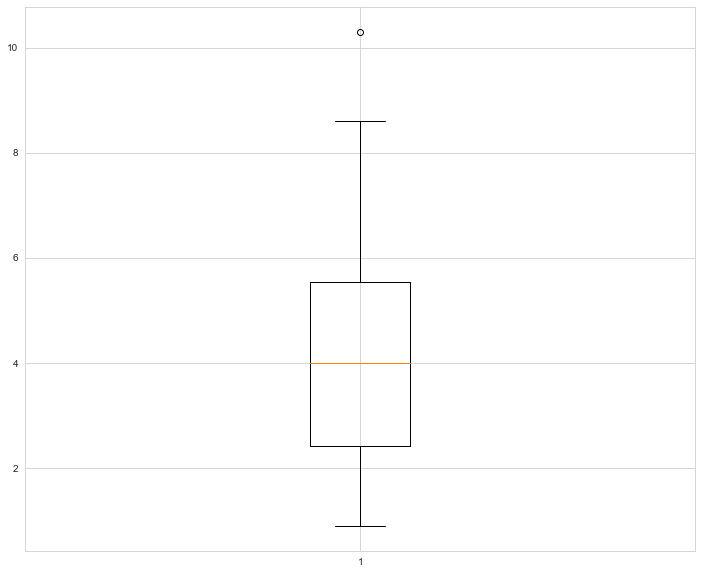

In [14]:
sns.set_style("whitegrid")
plt.figure(figsize=(12,10))
plt.boxplot(dados['Murder.Rate'])

In [62]:
q3 = np.percentile(dados['Murder.Rate'], 75)
q1 = np.percentile(dados['Murder.Rate'], 25)
iqr = q3-q1
ls = q3 + 1.5*iqr
li = q1 - 1.5*iqr
ls

10.237499999999997

### 1.6 Tabela de Frequências e Histogramas

In [63]:
df = dados['Population']
df.sort_values(ascending=True)

# Amplitude dos dados = Valor maior dos registros - menor valor
at = df.max() - df.min()

# Lembrando que k = raiz quadrada do total de registros/amostras
k = math.sqrt(len(df))
# O valor de amplitude de classe pode ser arredondado para um número inteiro, geralmente para facilitar a interpretação da tabela.
h = at/k 
h = math.ceil(h)

frequencias = []

# Menor valor da série
menor = round(df.min(),1)

# Menor valor somado a amplitude
menor_amp = round(menor+h,1)

valor = menor
while valor < df.max():
    frequencias.append('{} - {}'.format(round(valor,1),round(valor+h,1)))
    valor += h

freq_abs = pd.qcut(df,len(frequencias),labels=frequencias) # Discretização dos valores em k faixas, rotuladas pela lista criada anteriormente
print(pd.value_counts(freq_abs))

36885205 - 42074002    7
563626 - 5752423       7
31696408 - 36885205    6
26507611 - 31696408    6
21318814 - 26507611    6
16130017 - 21318814    6
10941220 - 16130017    6
5752423 - 10941220     6
Name: Population, dtype: int64


In [17]:
fig = px.histogram(dados, x="Population")
fig.show()

In [64]:
px.box(dados.Population)

### 1.7 Estimativas de Densidade

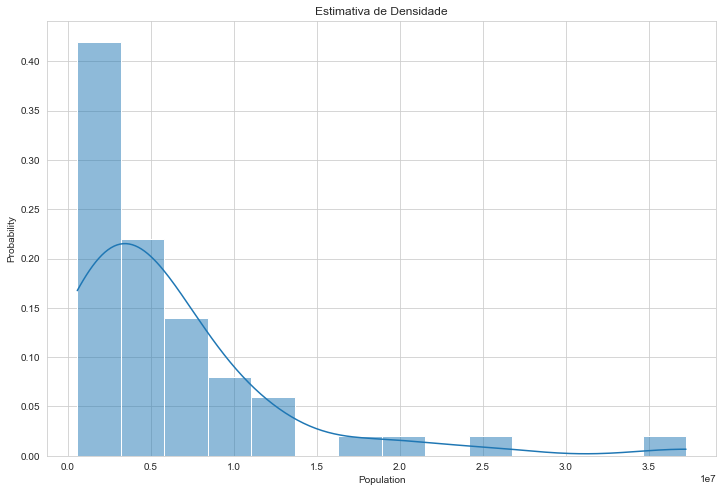

In [18]:
ax = sns.histplot(data = dados, x = "Population", kde = True, stat='probability').set_title("Estimativa de Densidade")
ax.figure.set_size_inches(12, 8)

## 2. Explorando dados

In [68]:
diabetes = pd.read_csv('diabetes.csv', sep=",")
diabetes.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [69]:
diabetes.shape

(768, 9)

In [70]:
diabetes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [71]:
diabetes.Outcome.value_counts()

0    500
1    268
Name: Outcome, dtype: int64

In [72]:
diabetes['Outcome'] = np.where(diabetes.Outcome==1, 'POSITIVO', 'NEGATIVO')
diabetes.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,POSITIVO
1,1,85,66,29,0,26.6,0.351,31,NEGATIVO
2,8,183,64,0,0,23.3,0.672,32,POSITIVO
3,1,89,66,23,94,28.1,0.167,21,NEGATIVO
4,0,137,40,35,168,43.1,2.288,33,POSITIVO


In [73]:
diabetes.Outcome.value_counts()

NEGATIVO    500
POSITIVO    268
Name: Outcome, dtype: int64

In [74]:
diabetes.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000


In [75]:
pandas_profiling.ProfileReport(diabetes)

Será que existe diferença entre positivos e negativos quanto a idade?

In [24]:
px.box(diabetes, y='Age', x = 'Outcome')

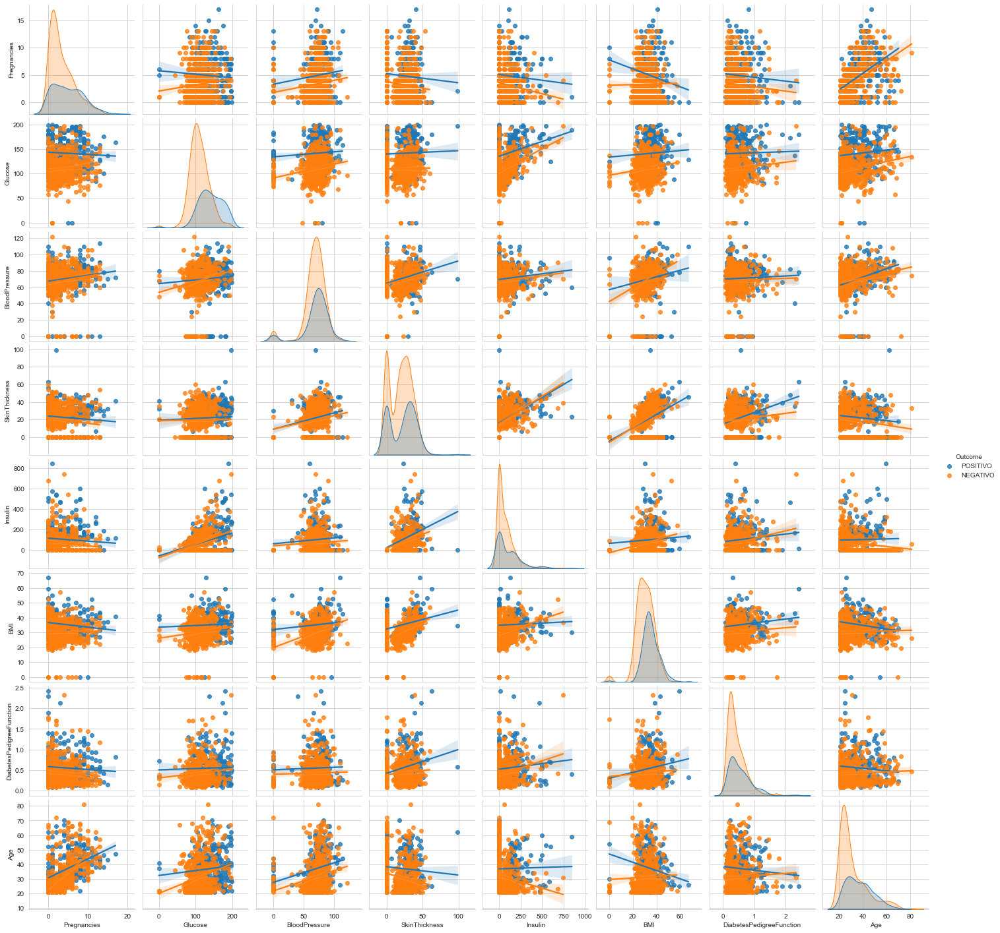

In [25]:
sns.pairplot(diabetes, hue='Outcome', kind='reg')

## Atividade:

Sobre o dataset **penguins_iter**:

* Quantas variáveis?

* O que elas mostram?

* São significativas?

* Explore graficamente

* Explore através das métricas apresentadas.